In [3]:
import os
from os import listdir

In [4]:
train_data=r'C:\Users\91749\Downloads\Clothes@train'
test_data=r'C:\Users\91749\Downloads\Clothes@test'

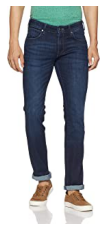

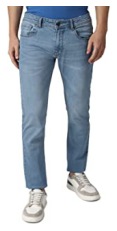

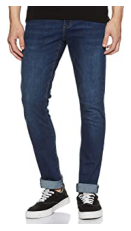

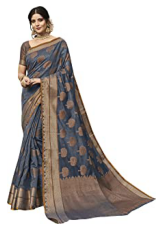

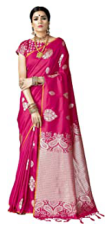

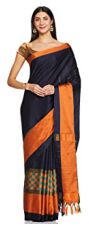

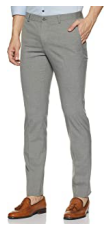

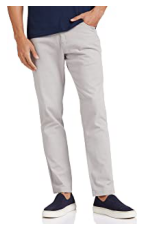

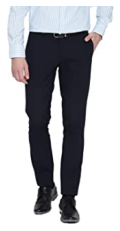

In [5]:
# Let's try to print some of the scrapped images from each category
import matplotlib.image as mpimg
import matplotlib.pyplot as plt

train_jeans=r'C:\Users\91749\Downloads\Clothes@train\jean@train'
train_saree=r'C:\Users\91749\Downloads\Clothes@train\saree@train'
train_trouser=r'C:\Users\91749\Downloads\Clothes@train\trouser@train'


Cloth_train=[train_jeans, train_saree, train_trouser]
for dirs in Cloth_train:
    k=listdir(dirs)
    for i in k[:3]:
        img=mpimg.imread('{}/{}'.format(dirs,i))
        plt.imshow(img)
        plt.axis('off')
        plt.show()

In [6]:
file1 = os.listdir(r'C:\Users\91749\Downloads\Clothes@train')
file1

['jean@train', 'saree@train', 'trouser@train']

In [7]:
file2 = os.listdir(r'C:\Users\91749\Downloads\Clothes@test')
file2

['jean@test', 'saree@test', 'trouser@test']

In [8]:
print("Count of Training Images")
print("No.of Images of Sarees in train dataset -> ",len(os.listdir(r'C:\Users\91749\Downloads\Clothes@train\jean@train')))
print("No.of Images of Jeans in train dataset -> ",len(os.listdir(r'C:\Users\91749\Downloads\Clothes@train\saree@train')))
print("No.of Images of Trousers in train dataset ->",len(os.listdir(r'C:\Users\91749\Downloads\Clothes@train\trouser@train')))
"\n"

print("Count of Test Images")
print("No.of Images of Sarees in test dataset-> ",len(os.listdir(r"C:\Users\91749\Downloads\Clothes@test\jean@test")))
print("No.of Images of Jeans in test dataset ->",len(os.listdir(r"C:\Users\91749\Downloads\Clothes@test\saree@test")))
print("No.of Images of Trousers in test dataset-> ",len(os.listdir(r"C:\Users\91749\Downloads\Clothes@test\trouser@test")))

Count of Training Images
No.of Images of Sarees in train dataset ->  324
No.of Images of Jeans in train dataset ->  324
No.of Images of Trousers in train dataset -> 324
Count of Test Images
No.of Images of Sarees in test dataset->  104
No.of Images of Jeans in test dataset -> 104
No.of Images of Trousers in test dataset->  104


In [10]:
!pip install tensorflow

In [11]:
#importing all the required libraries
import pandas as pd
import numpy as np
from tensorflow import keras
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Dropout, Activation, Conv2D, MaxPooling2D,BatchNormalization
from tensorflow.keras import optimizers
from keras.models import load_model
from tensorflow.keras.preprocessing import image
import random
import scipy
import pylab as pl
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import warnings 
warnings.filterwarnings("ignore")

In [12]:
#Defining dimensions of images and other parameters
input_shape=(128,128,3)
img_width=128
img_height=128
batch_size=12
epoch=100
train_samples=324
test_samples=104

In [15]:
# Data Augmentation on Training Images

Train_datagen=ImageDataGenerator(rescale=1./255,
                                             zoom_range=0.2,
                                             rotation_range=30,
                                             horizontal_flip=True)
Training_set=Train_datagen.flow_from_directory(train_data,
                                                              target_size=(img_width,img_height),
                                                              batch_size=batch_size, 
                                                              class_mode='categorical')

# Test Data Generator
Test_datagen=ImageDataGenerator(rescale=1./255)
Test_set=Test_datagen.flow_from_directory(test_data,
                                                  target_size=(img_width,img_height),
                                                  batch_size=batch_size, 
                                                  class_mode='categorical')

Found 972 images belonging to 3 classes.
Found 312 images belonging to 3 classes.


In [16]:
# Creating the model
model=Sequential()

# First convolution layer
model.add(Conv2D(32,(3,3),input_shape=input_shape))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Second convolution layer
model.add(Conv2D(32,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Third convolution layer
model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))

# Fourth convolution layer
model.add(Conv2D(64,(3,3)))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))


model.add(Flatten())
model.add(Dense(128))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(3))
model.add(Activation('softmax'))

print(model.summary())

model.compile(loss='categorical_crossentropy',optimizer='adam',metrics=['accuracy'])

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 126, 126, 32)      896       
                                                                 
 activation (Activation)     (None, 126, 126, 32)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 63, 63, 32)       0         
 )                                                               
                                                                 
 dropout (Dropout)           (None, 63, 63, 32)        0         
                                                                 
 conv2d_1 (Conv2D)           (None, 61, 61, 32)        9248      
                                                                 
 activation_1 (Activation)   (None, 61, 61, 32)        0         
                                                        

In [17]:
# Defining Early stopping and Model check point
from keras.callbacks import EarlyStopping
from keras.callbacks import ModelCheckpoint

ES = EarlyStopping(monitor='val_loss', mode='min', verbose=1, patience=30)
MC = ModelCheckpoint('best.h5', monitor='val_accuracy', mode='max', verbose=1, save_best_only=True)

In [18]:
# Fitting the Training Data
history = model.fit(
    Training_set, 
    epochs=epoch,
    validation_data=Test_set,
    validation_steps=test_samples//batch_size,
    steps_per_epoch=train_samples//batch_size,
    callbacks=[ES,MC])

Epoch 1/100
27/27 [==============================] - ETA: 0s - loss: 1.0944 - accuracy: 0.4877
Epoch 1: val_accuracy improved from -inf to 0.65625, saving model to best.h5
27/27 [==============================] - 4s 123ms/step - loss: 1.0944 - accuracy: 0.4877 - val_loss: 1.0353 - val_accuracy: 0.6562
Epoch 2/100
27/27 [==============================] - ETA: 0s - loss: 0.8166 - accuracy: 0.5926
Epoch 2: val_accuracy did not improve from 0.65625
27/27 [==============================] - 3s 106ms/step - loss: 0.8166 - accuracy: 0.5926 - val_loss: 0.7525 - val_accuracy: 0.6562
Epoch 3/100
27/27 [==============================] - ETA: 0s - loss: 0.5979 - accuracy: 0.7068
Epoch 3: val_accuracy did not improve from 0.65625
27/27 [==============================] - 3s 110ms/step - loss: 0.5979 - accuracy: 0.7068 - val_loss: 0.6559 - val_accuracy: 0.6562
Epoch 4/100
27/27 [==============================] - ETA: 0s - loss: 0.5732 - accuracy: 0.7068
Epoch 4: val_accuracy improved from 0.65625 to 0

In [19]:
#Saving the best model
model.save('best_model.h5')

In [20]:
losses = pd.DataFrame(model.history.history)
losses

,loss,accuracy,val_loss,val_accuracy
0,1.094446,0.487654,1.035285,0.656250
1,0.816648,0.592593,0.752467,0.656250
2,0.597934,0.706790,0.655883,0.656250
3,0.573205,0.706790,0.552497,0.760417
4,0.549163,0.737654,0.574023,0.666667
...,...,...,...,...
91,0.321321,0.864198,0.462343,0.854167
92,0.294433,0.888889,0.454933,0.864583
93,0.320523,0.845679,0.462528,0.875000
94,0.294555,0.870370,0.365229,0.906250


In [21]:
#Loading the saved model
saved_model = load_model('best_model.h5')

In [22]:
#creating instances where elements from test directory will be called
test_jeans=r"C:\Users\91749\Downloads\Clothes@test\jean@test"
test_saree=r"C:\Users\91749\Downloads\Clothes@test\saree@test"
test_trouser=r"C:\Users\91749\Downloads\Clothes@test\trouser@test"

Input Image is: img325.jpeg


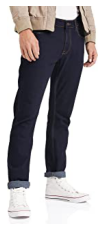

1/1 [==============================] - 0s 96ms/step
Predicted Label is: [0] 

Input Image is: img326.jpeg


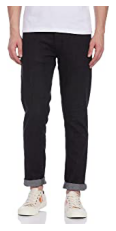

1/1 [==============================] - 0s 22ms/step
Predicted Label is: [0] 

Input Image is: img327.jpeg


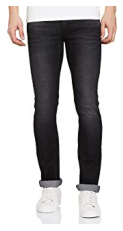

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img328.jpeg


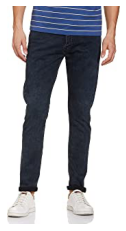

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img329.jpeg


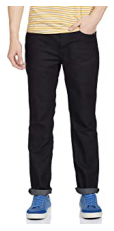

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img330.jpeg


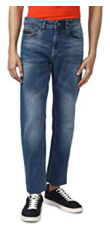

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img331.jpeg


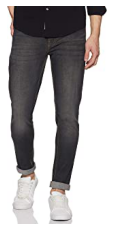

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img332.jpeg


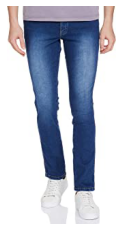

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img333.jpeg


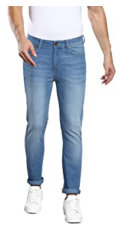

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img334.jpeg


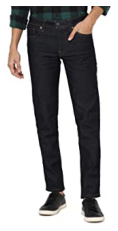

1/1 [==============================] - 0s 21ms/step
Predicted Label is: [0] 

Input Image is: img335.jpeg


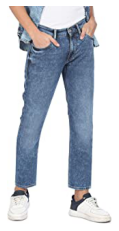

1/1 [==============================] - 0s 21ms/step
Predicted Label is: [0] 

Input Image is: img336.jpeg


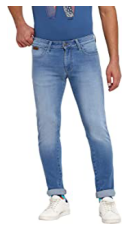

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img337.jpeg


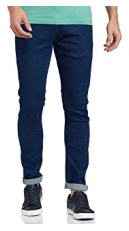

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img338.jpeg


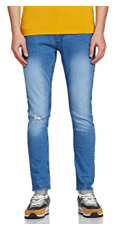

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img339.jpeg


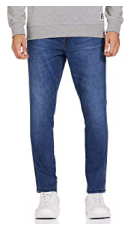

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img340.jpeg


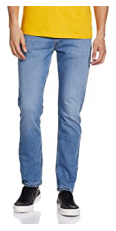

1/1 [==============================] - 0s 22ms/step
Predicted Label is: [0] 

Input Image is: img341.jpeg


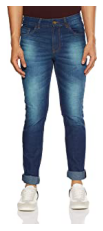

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img342.jpeg


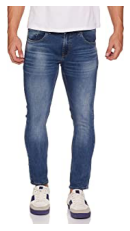

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img343.jpeg


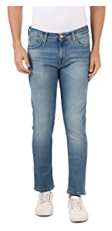

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img344.jpeg


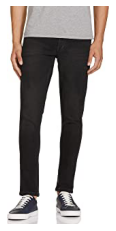

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img345.jpeg


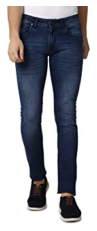

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img346.jpeg


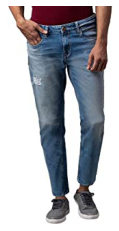

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img347.jpeg


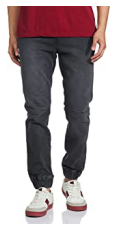

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img348.jpeg


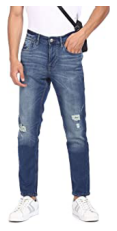

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img349.jpeg


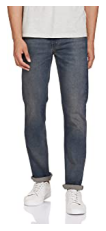

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img350.jpeg


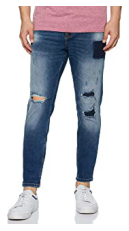

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img351.jpeg


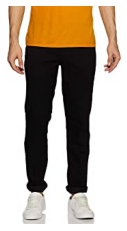

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img352.jpeg


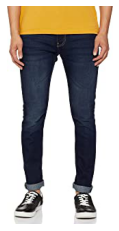

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img353.jpeg


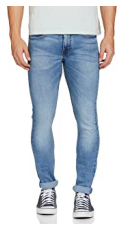

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img354.jpeg


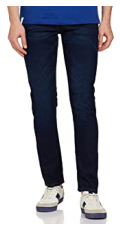

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img355.jpeg


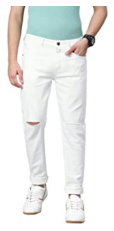

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img356.jpeg


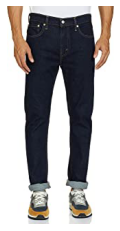

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img357.jpeg


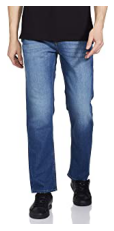

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img358.jpeg


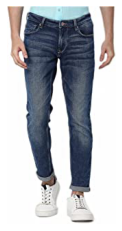

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img359.jpeg


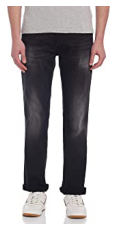

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img360.jpeg


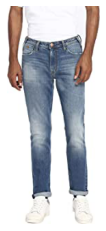

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img361.jpeg


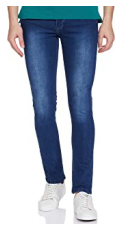

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img362.jpeg


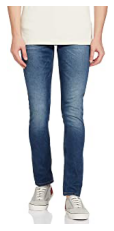

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img363.jpeg


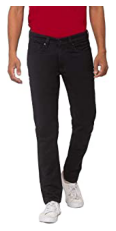

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img364.jpeg


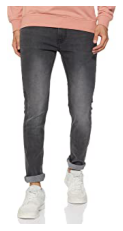

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img365.jpeg


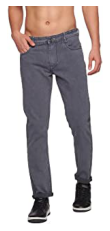

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img366.jpeg


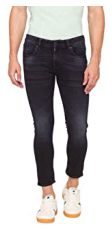

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img367.jpeg


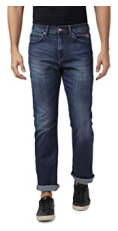

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img368.jpeg


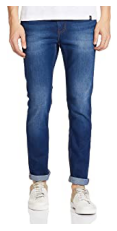

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img369.jpeg


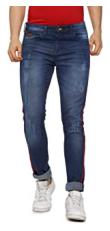

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img370.jpeg


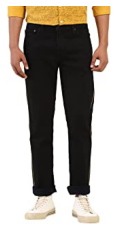

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img371.jpeg


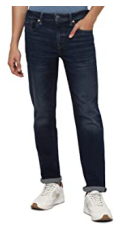

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img372.jpeg


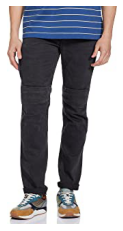

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img373.jpeg


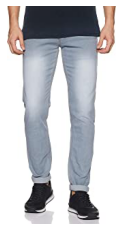

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img374.jpeg


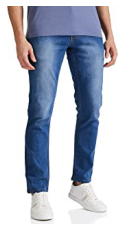

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img375.jpeg


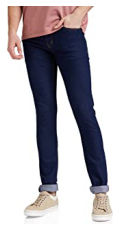

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img376.jpeg


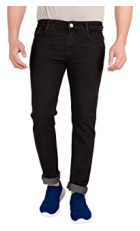

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img377.jpeg


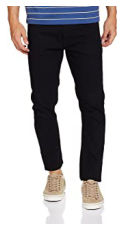

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img378.jpeg


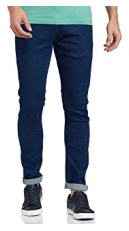

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [0] 

Input Image is: img379.jpeg


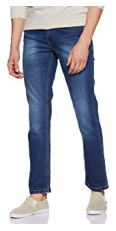

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [0] 

Input Image is: img380.jpeg


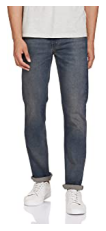

1/1 [==============================] - 0s 21ms/step
Predicted Label is: [0] 

Input Image is: img381.jpeg


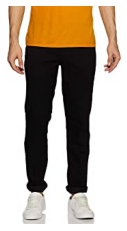

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img382.jpeg


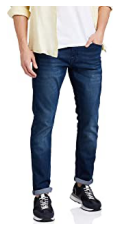

1/1 [==============================] - 0s 21ms/step
Predicted Label is: [0] 

Input Image is: img383.jpeg


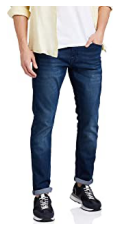

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [0] 

Input Image is: img384.jpeg


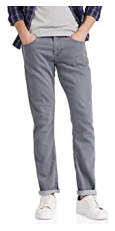

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img385.jpeg


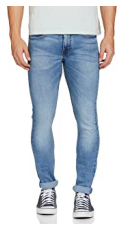

1/1 [==============================] - 0s 22ms/step
Predicted Label is: [0] 

Input Image is: img386.jpeg


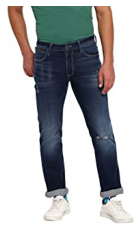

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [0] 

Input Image is: img387.jpeg


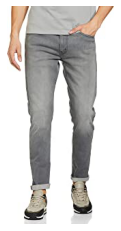

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img388.jpeg


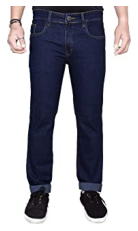

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img389.jpeg


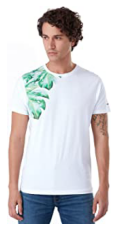

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img390.jpeg


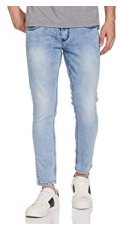

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img391.jpeg


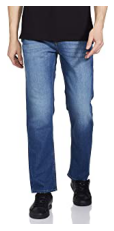

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img392.jpeg


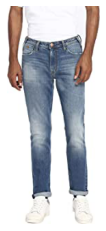

1/1 [==============================] - 0s 23ms/step
Predicted Label is: [0] 

Input Image is: img393.jpeg


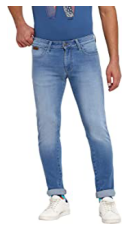

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img394.jpeg


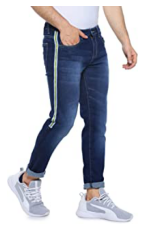

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img395.jpeg


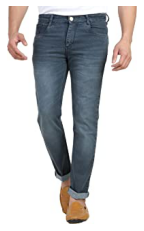

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [0] 

Input Image is: img396.jpeg


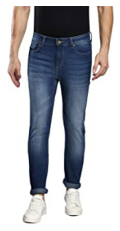

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img397.jpeg


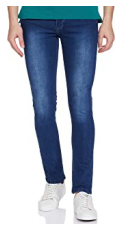

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [0] 

Input Image is: img398.jpeg


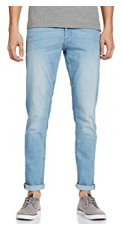

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img399.jpeg


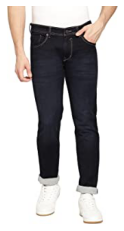

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img400.jpeg


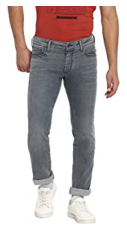

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img401.jpeg


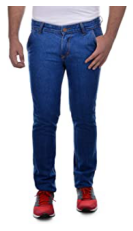

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img402.jpeg


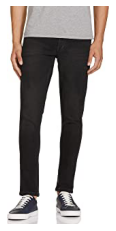

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img403.jpeg


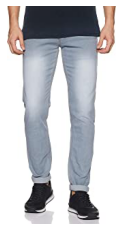

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img404.jpeg


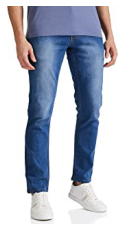

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img405.jpeg


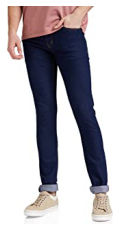

1/1 [==============================] - 0s 16ms/step
Predicted Label is: [0] 

Input Image is: img406.jpeg


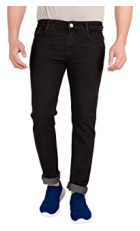

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img407.jpeg


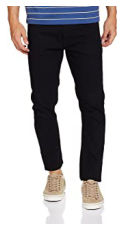

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img408.jpeg


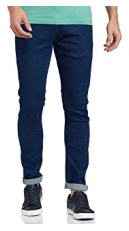

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img409.jpeg


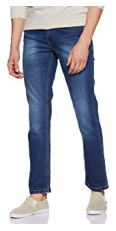

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img410.jpeg


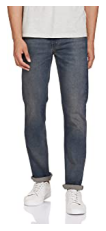

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img411.jpeg


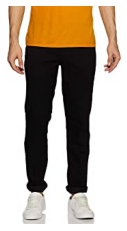

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img412.jpeg


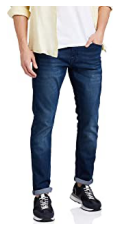

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img413.jpeg


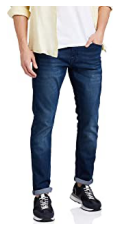

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img414.jpeg


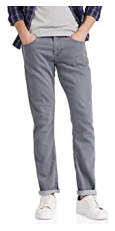

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img415.jpeg


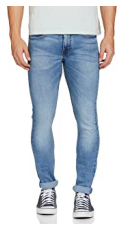

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img416.jpeg


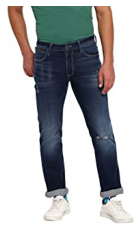

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img417.jpeg


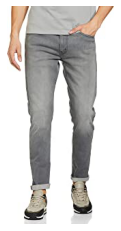

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img418.jpeg


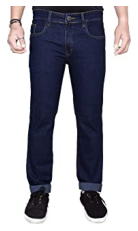

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img419.jpeg


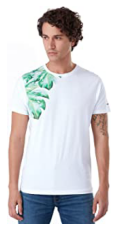

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img420.jpeg


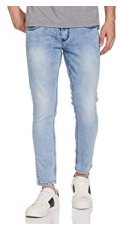

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img421.jpeg


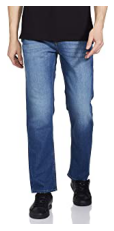

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img422.jpeg


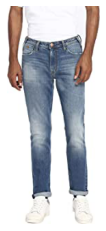

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img423.jpeg


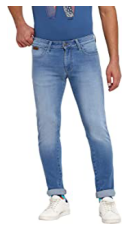

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img424.jpeg


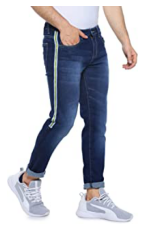

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img425.jpeg


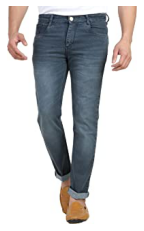

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img426.jpeg


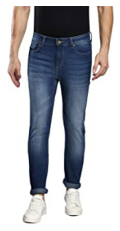

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img427.jpeg


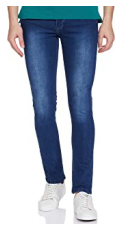

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img428.jpeg


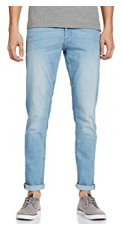

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img325.jpeg


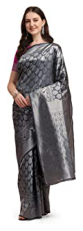

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img326.jpeg


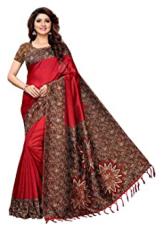

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [1] 

Input Image is: img327.jpeg


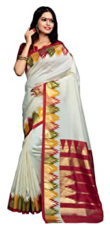

1/1 [==============================] - 0s 16ms/step
Predicted Label is: [1] 

Input Image is: img328.jpeg


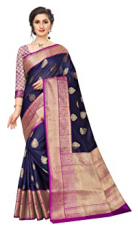

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img329.jpeg


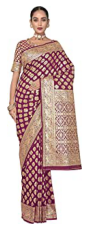

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img330.jpeg


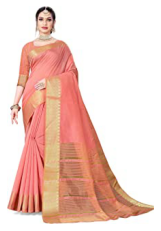

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img331.jpeg


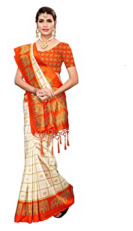

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img332.jpeg


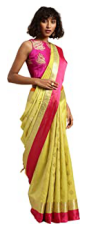

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img333.jpeg


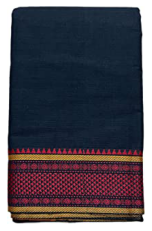

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img334.jpeg


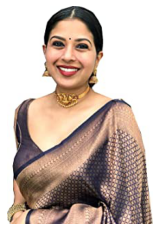

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img335.jpeg


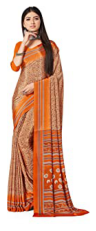

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img336.jpeg


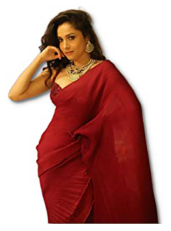

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img337.jpeg


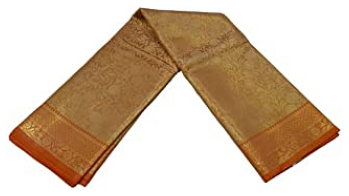

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img338.jpeg


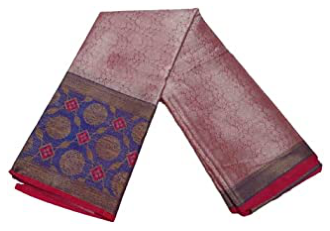

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img339.jpeg


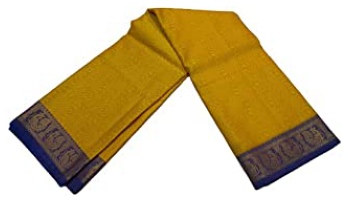

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img340.jpeg


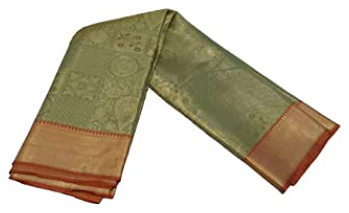

1/1 [==============================] - 0s 16ms/step
Predicted Label is: [2] 

Input Image is: img341.jpeg


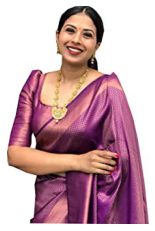

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img342.jpeg


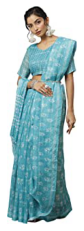

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [1] 

Input Image is: img343.jpeg


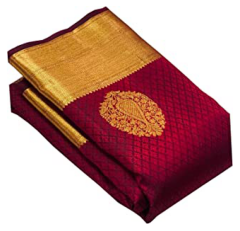

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img344.jpeg


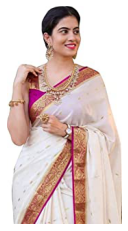

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img345.jpeg


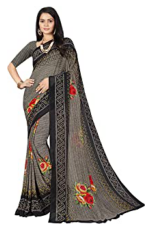

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img346.jpeg


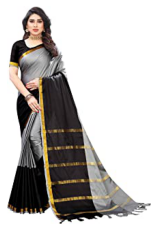

1/1 [==============================] - 0s 21ms/step
Predicted Label is: [2] 

Input Image is: img347.jpeg


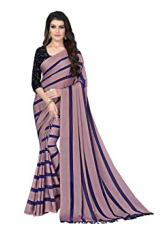

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [1] 

Input Image is: img348.jpeg


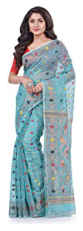

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [1] 

Input Image is: img349.jpeg


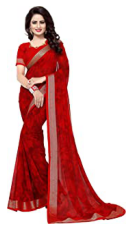

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img350.jpeg


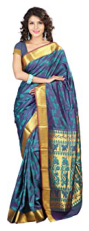

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [1] 

Input Image is: img351.jpeg


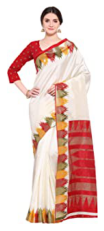

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [1] 

Input Image is: img352.jpeg


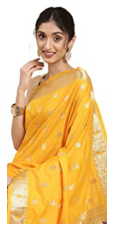

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [1] 

Input Image is: img353.jpeg


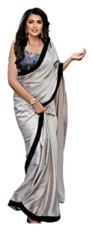

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img354.jpeg


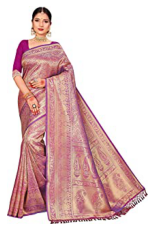

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img355.jpeg


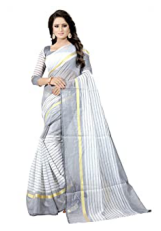

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img356.jpeg


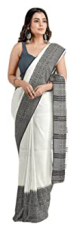

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img357.jpeg


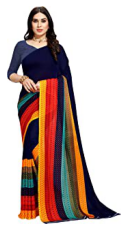

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [1] 

Input Image is: img358.jpeg


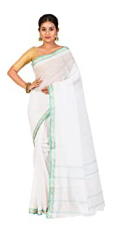

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img359.jpeg


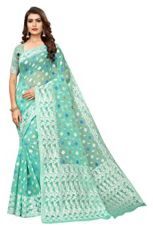

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img360.jpeg


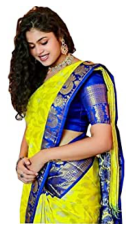

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img361.jpeg


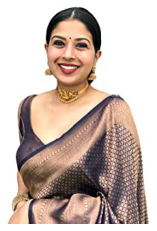

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img362.jpeg


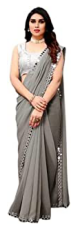

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img363.jpeg


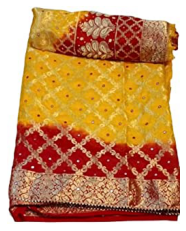

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [1] 

Input Image is: img364.jpeg


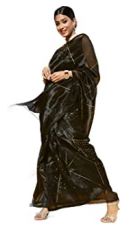

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [1] 

Input Image is: img365.jpeg


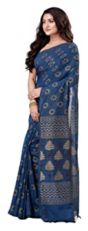

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img366.jpeg


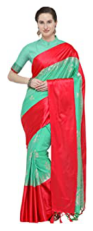

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img367.jpeg


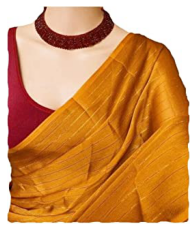

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img368.jpeg


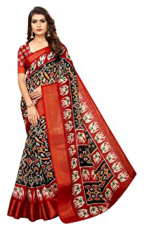

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img369.jpeg


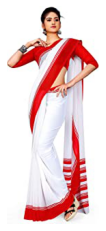

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img370.jpeg


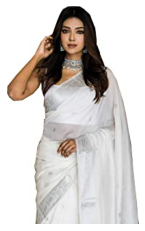

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img371.jpeg


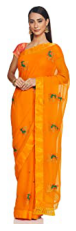

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img372.jpeg


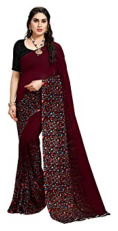

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img373.jpeg


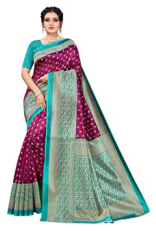

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img374.jpeg


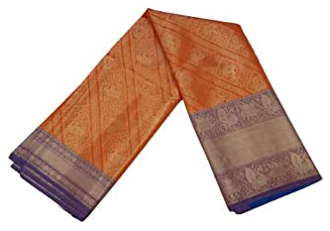

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img375.jpeg


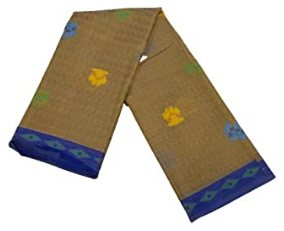

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img376.jpeg


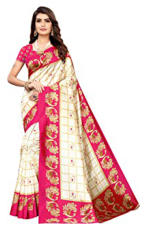

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img377.jpeg


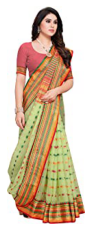

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img378.jpeg


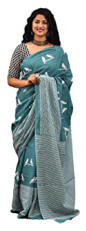

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img379.jpeg


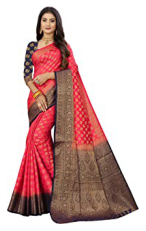

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img380.jpeg


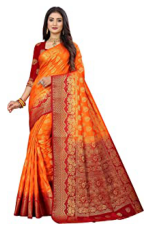

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img381.jpeg


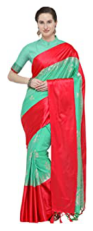

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img382.jpeg


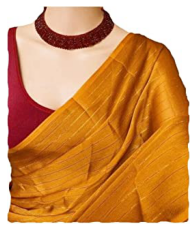

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img383.jpeg


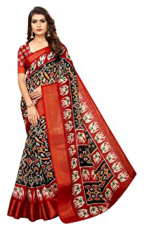

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img384.jpeg


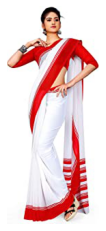

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img385.jpeg


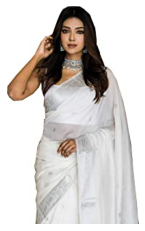

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img386.jpeg


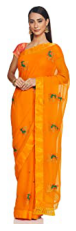

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img387.jpeg


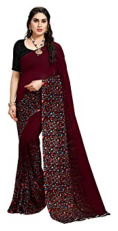

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img388.jpeg


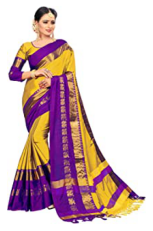

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img389.jpeg


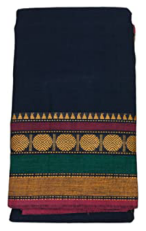

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img390.jpeg


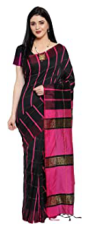

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [1] 

Input Image is: img391.jpeg


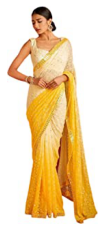

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [1] 

Input Image is: img392.jpeg


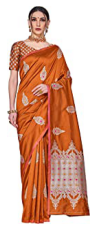

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [1] 

Input Image is: img393.jpeg


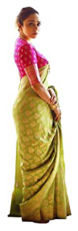

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [1] 

Input Image is: img394.jpeg


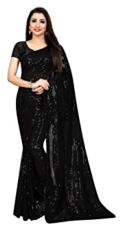

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img395.jpeg


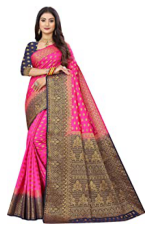

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img396.jpeg


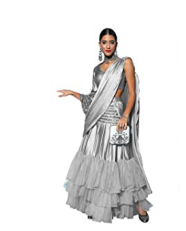

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img397.jpeg


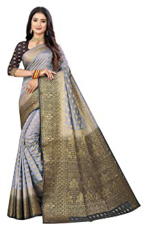

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img398.jpeg


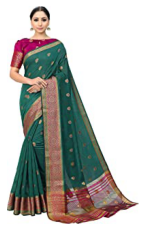

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img399.jpeg


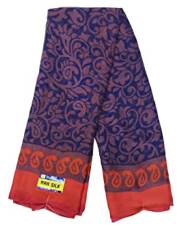

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img400.jpeg


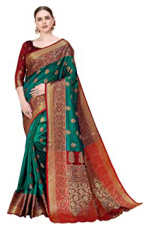

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img401.jpeg


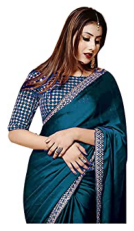

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img402.jpeg


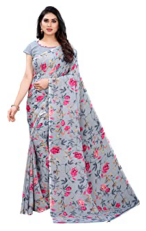

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img403.jpeg


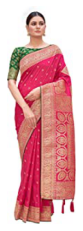

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img404.jpeg


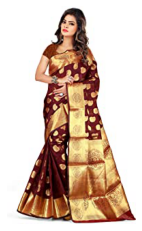

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img405.jpeg


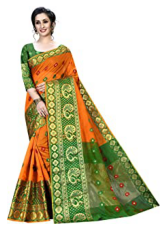

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img406.jpeg


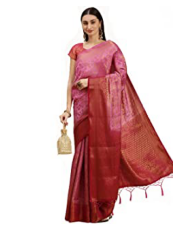

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img407.jpeg


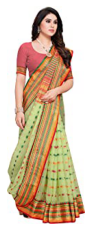

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img408.jpeg


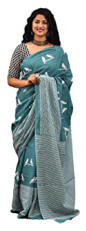

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img409.jpeg


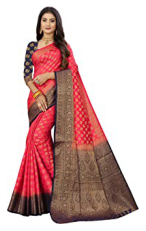

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img410.jpeg


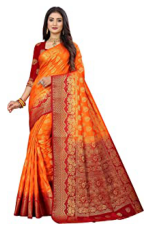

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img411.jpeg


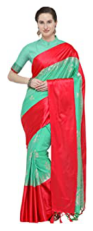

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img412.jpeg


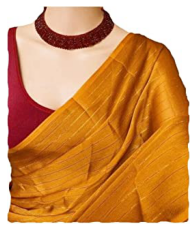

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img413.jpeg


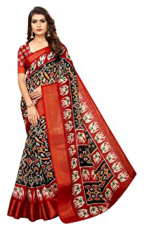

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img414.jpeg


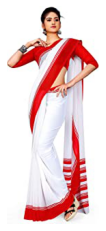

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img415.jpeg


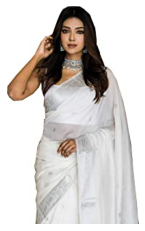

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img416.jpeg


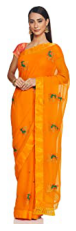

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img417.jpeg


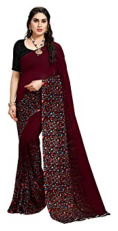

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img418.jpeg


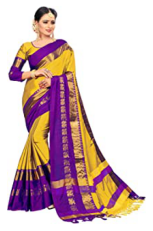

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img419.jpeg


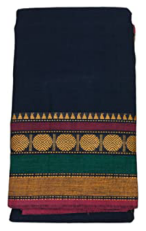

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img420.jpeg


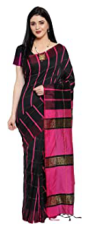

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img421.jpeg


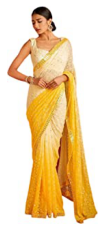

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img422.jpeg


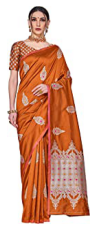

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img423.jpeg


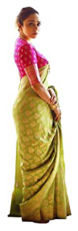

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img424.jpeg


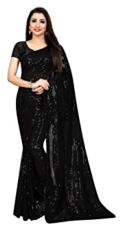

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img425.jpeg


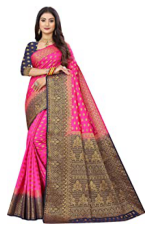

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img426.jpeg


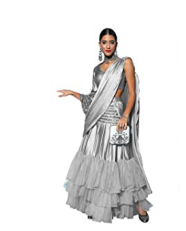

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img427.jpeg


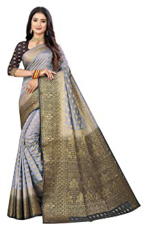

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img428.jpeg


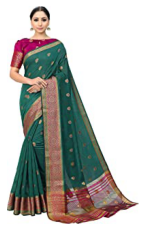

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img325.jpeg


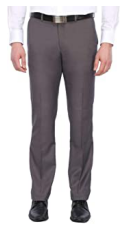

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img326.jpeg


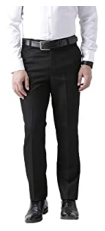

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img327.jpeg


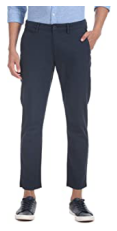

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img328.jpeg


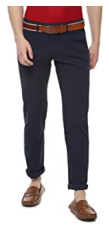

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img329.jpeg


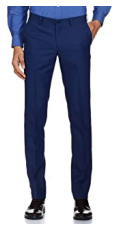

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img330.jpeg


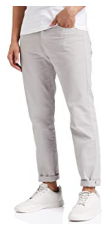

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img331.jpeg


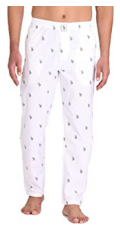

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img332.jpeg


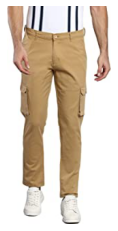

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img333.jpeg


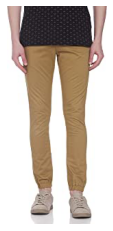

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img334.jpeg


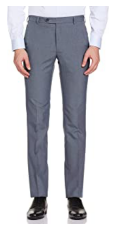

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img335.jpeg


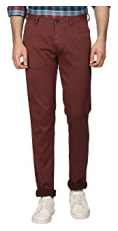

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img336.jpeg


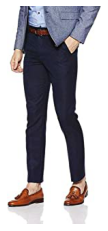

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img337.jpeg


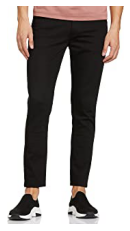

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img338.jpeg


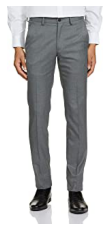

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img339.jpeg


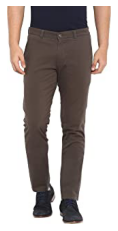

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img340.jpeg


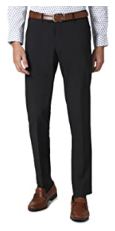

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img341.jpeg


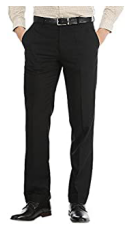

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img342.jpeg


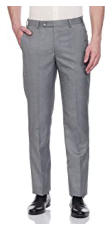

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img343.jpeg


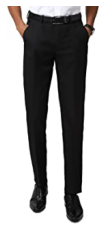

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img344.jpeg


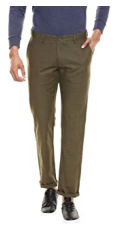

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img345.jpeg


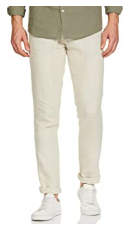

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img346.jpeg


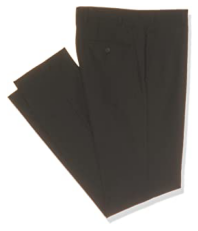

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img347.jpeg


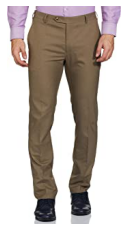

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img348.jpeg


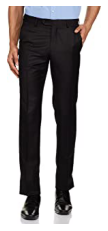

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img349.jpeg


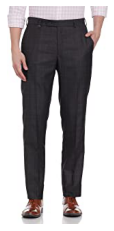

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img350.jpeg


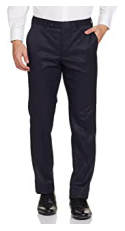

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img351.jpeg


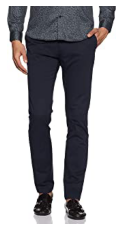

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img352.jpeg


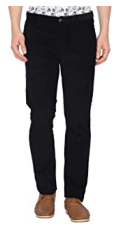

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img353.jpeg


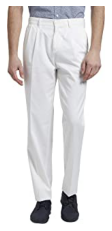

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img354.jpeg


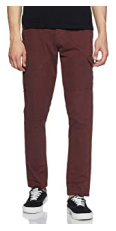

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img355.jpeg


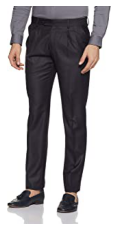

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img356.jpeg


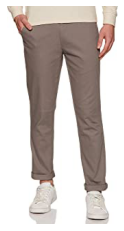

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img357.jpeg


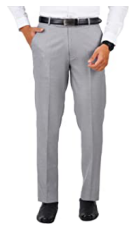

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img358.jpeg


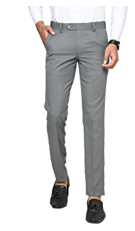

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img359.jpeg


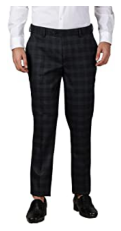

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img360.jpeg


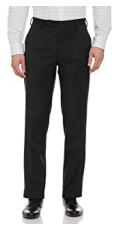

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img361.jpeg


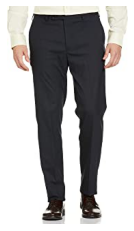

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img362.jpeg


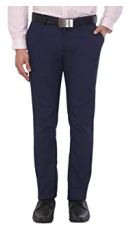

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img363.jpeg


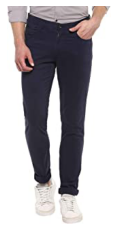

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img364.jpeg


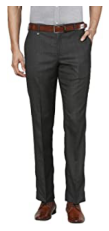

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img365.jpeg


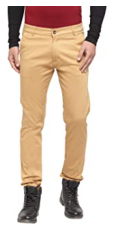

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img366.jpeg


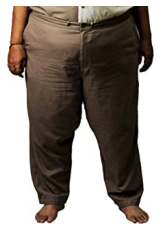

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img367.jpeg


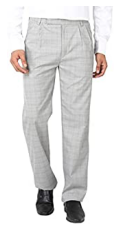

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img368.jpeg


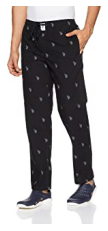

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img369.jpeg


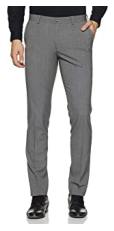

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img370.jpeg


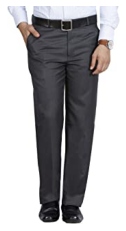

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img371.jpeg


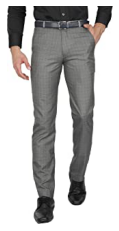

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img372.jpeg


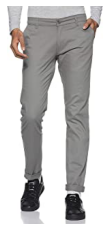

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img373.jpeg


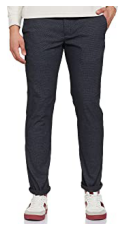

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img374.jpeg


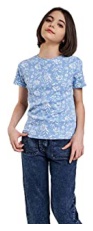

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [1] 

Input Image is: img375.jpeg


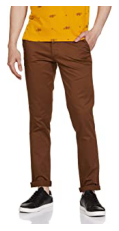

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img376.jpeg


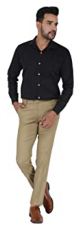

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img377.jpeg


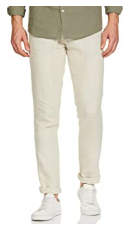

1/1 [==============================] - 0s 21ms/step
Predicted Label is: [2] 

Input Image is: img378.jpeg


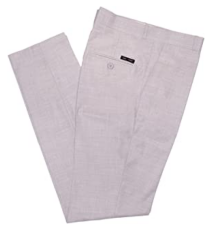

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img379.jpeg


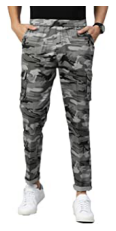

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img380.jpeg


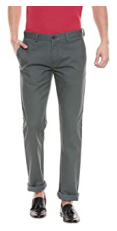

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img381.jpeg


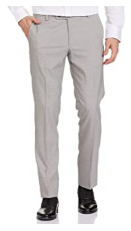

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img382.jpeg


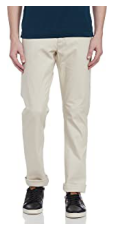

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img383.jpeg


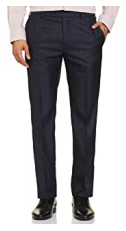

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img384.jpeg


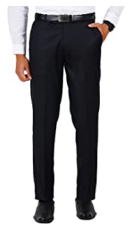

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img385.jpeg


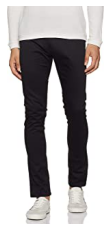

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img386.jpeg


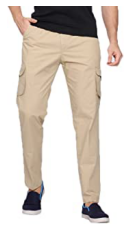

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img387.jpeg


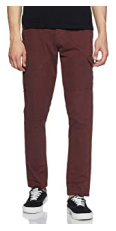

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img388.jpeg


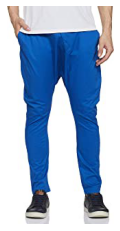

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img389.jpeg


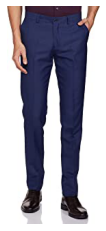

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img390.jpeg


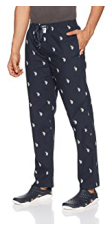

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [0] 

Input Image is: img391.jpeg


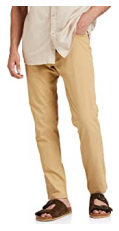

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img392.jpeg


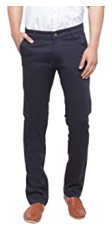

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img393.jpeg


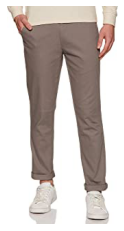

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img394.jpeg


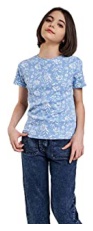

1/1 [==============================] - 0s 23ms/step
Predicted Label is: [1] 

Input Image is: img395.jpeg


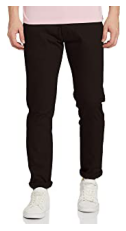

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img396.jpeg


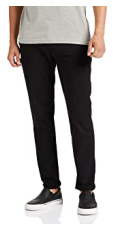

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img397.jpeg


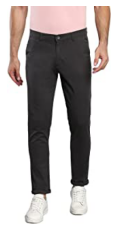

1/1 [==============================] - 0s 20ms/step
Predicted Label is: [2] 

Input Image is: img398.jpeg


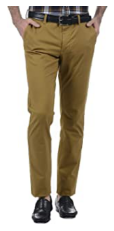

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img399.jpeg


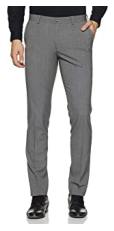

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img400.jpeg


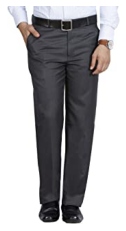

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img401.jpeg


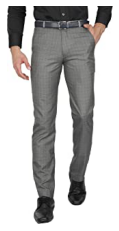

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img402.jpeg


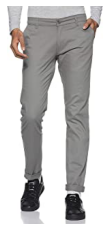

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img403.jpeg


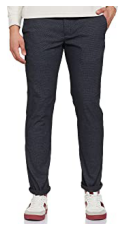

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img404.jpeg


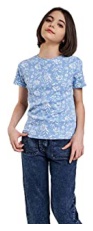

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [1] 

Input Image is: img405.jpeg


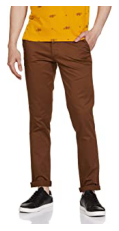

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img406.jpeg


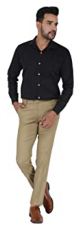

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img407.jpeg


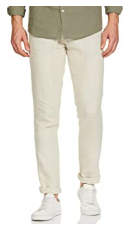

1/1 [==============================] - 0s 19ms/step
Predicted Label is: [2] 

Input Image is: img408.jpeg


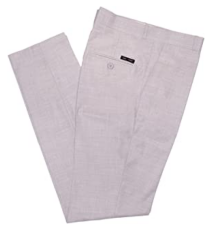

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img409.jpeg


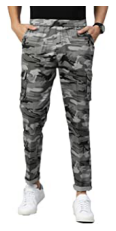

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img410.jpeg


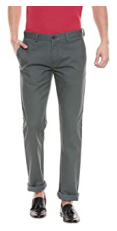

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img411.jpeg


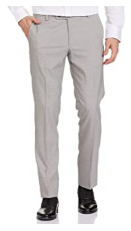

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img412.jpeg


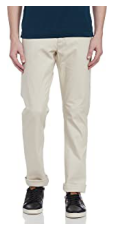

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img413.jpeg


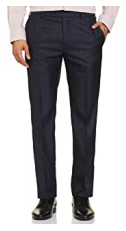

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img414.jpeg


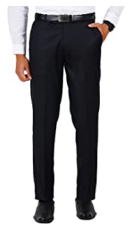

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img415.jpeg


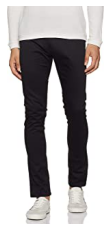

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img416.jpeg


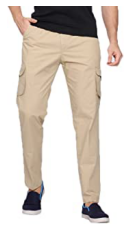

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img417.jpeg


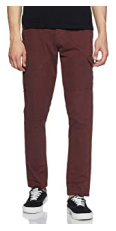

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img418.jpeg


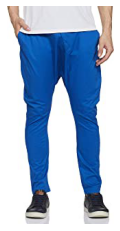

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img419.jpeg


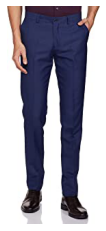

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [0] 

Input Image is: img420.jpeg


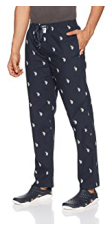

1/1 [==============================] - 0s 16ms/step
Predicted Label is: [0] 

Input Image is: img421.jpeg


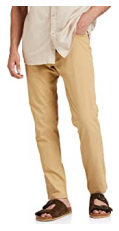

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img422.jpeg


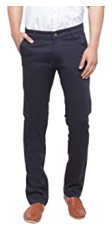

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img423.jpeg


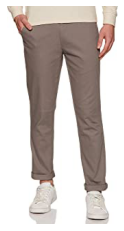

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 

Input Image is: img424.jpeg


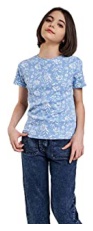

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [1] 

Input Image is: img425.jpeg


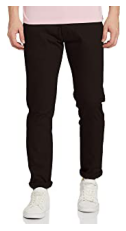

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [0] 

Input Image is: img426.jpeg


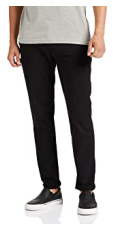

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img427.jpeg


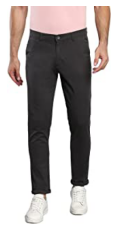

1/1 [==============================] - 0s 17ms/step
Predicted Label is: [2] 

Input Image is: img428.jpeg


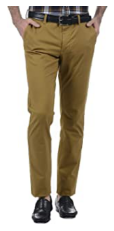

1/1 [==============================] - 0s 18ms/step
Predicted Label is: [2] 



In [23]:
test_dire=[test_jeans,test_saree,test_trouser]

for test_dir in test_dire:
    for i in listdir(test_dir):
        print("Input Image is:",i)
        img= image.load_img('{}/{}'.format(test_dir,i))                         
        test_image = image.load_img('{}/{}'.format(test_dir,i),target_size=(128, 128))
        test_image = image.img_to_array(test_image)
        plt.imshow(img)
        plt.axis('off')
        plt.show()
        test_image = np.expand_dims(test_image, axis=0)
        result = saved_model.predict(test_image)
        print("Predicted Label is:",np.argmax(result, axis=1),"\n")